# July 23 - VAE Training Analysis

In [7]:
# Imports
import math
import os
import sys
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D

# Add the path to the parent directory to augment search for module
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
if par_dir not in sys.path:
    sys.path.append(par_dir)
    
# Import the custom plotting module
from plot_utils import plot_utils
import random
import torch

In [8]:
# Label dict - Dictionary mapping integer labels to str
label_dict = {0:"gamma", 1:"e", 2:"mu"}

np.set_printoptions(threshold=np.inf)

def plot_event(run_id, iteration, mode):
    
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    
    if mode is "validation":
        np_arr_path = dump_dir + "val_iteration_" + str(iteration) + ".npz"
    else:
        np_arr_path = dump_dir + "iteration_" + str(iteration) + ".npz"
    
    # Load the numpy array
    np_arr = np.load(np_arr_path)
    np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["prediction"], np_arr["labels"], np_arr["energies"]

    i = random.randint(0, np_labels.shape[0]-1)
    plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                    label_dict[np_labels[i]], np_energies[i].item(),
                                    show_plot=True)

    plot_utils.plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                                np_recon, iteration, num_bins=200)
    
def plot_log(run_id, model_name, iteration, variant, mode):

    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

    # Setup the path to the training log file
    if mode is "training":
        log = dump_dir + "log_train.csv"
    elif mode is "training_validation":
        log = dump_dir + "val_test.csv"
    elif mode is "validation":
        log = dump_dir + "validation_log.csv"
    else:
        print("mode has to be one of training, training_validation, validation")
        return None
    
    downsample_interval = 32 if mode is "training" else None

    if variant is "AE":
        plot_utils.plot_ae_training([log], [model_name], {model_name:["red"]},
                                 downsample_interval=downsample_interval, show_plot=True, legend_loc=(0.8,0.8))
    elif variant is "VAE":
        plot_utils.plot_vae_training([log], [model_name], {model_name:["red", "blue"]},
                                 downsample_interval=downsample_interval, show_plot=True, legend_loc=(0.8,0.8))
        
    if iteration is not None:
        plot_event(run_id, iteration, mode=mode)
        
def plot_samples(run_id, num_samples, model_dir):
    
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    np_arr_path = dump_dir + "samples/" + model_dir + "/" + str(num_samples) + "_samples.npy"
    
    np_arr = np.load(np_arr_path)
    i, j = random.randint(0, np_arr.shape[0]-1), random.randint(0, np_arr.shape[0]-1)
    
    plot_utils.plot_actual_vs_recon(np_arr[i], np_arr[j], 
                                    "e", 500,
                                    show_plot=True)
    
    plot_utils.plot_charge_hist(np_arr[i],
                                np_arr[j], 0, num_bins=200)

## With the VAE failing while the KL loss converges, it raises an important issue that whether the mean-field approximation applied to the VAE is too strong.

## 1. Train the VAE after turning off the KL loss i.e. set the KL loss to 0 ( basically the distribution is no longer regularized to be a normal gaussian but can be a mixture of gaussians )

/home/akajal/WatChMaL/VAE/plot_utils/plot_utils.py:1177: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax2.set_yscale("log")


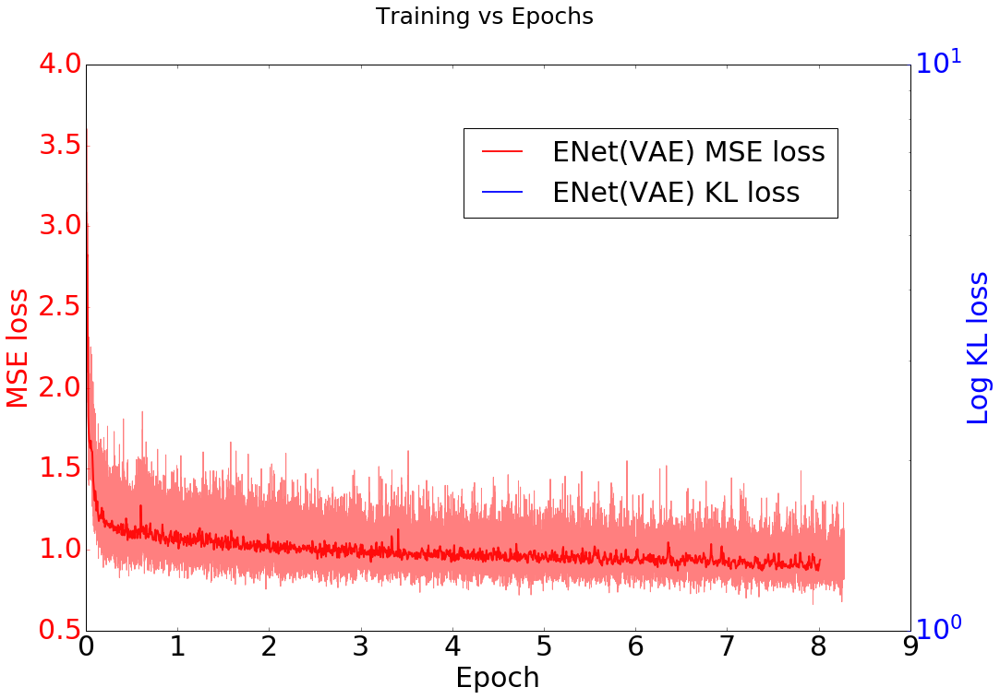

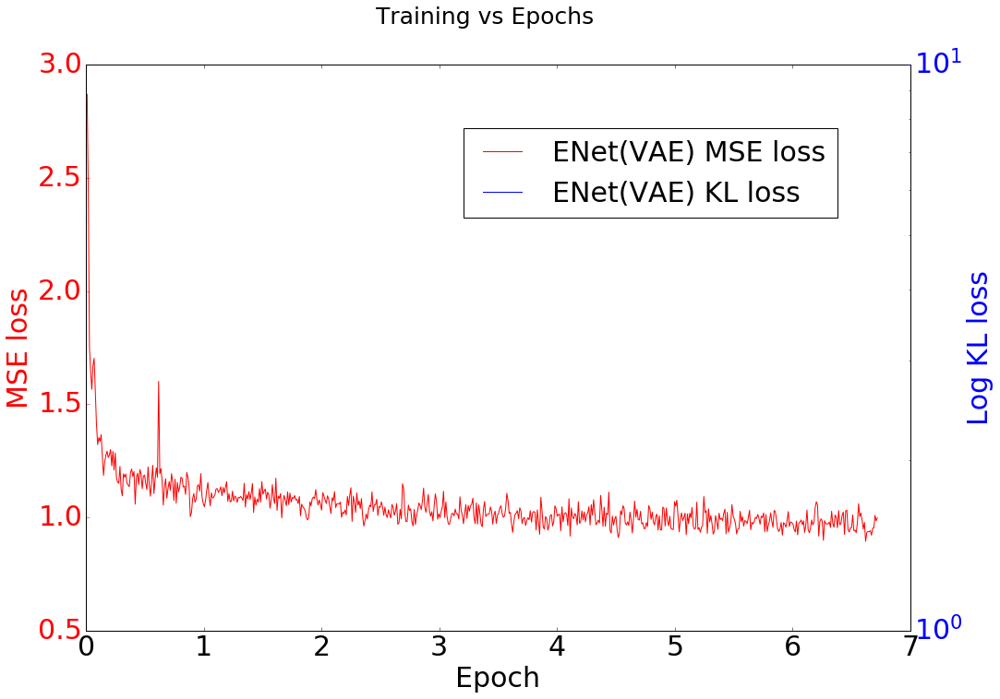

In [9]:
plot_log("20190723_010958", "ENet(VAE)", None, "VAE", "training")
plot_log("20190723_010958", "ENet(VAE)", None, "VAE", "training_validation")

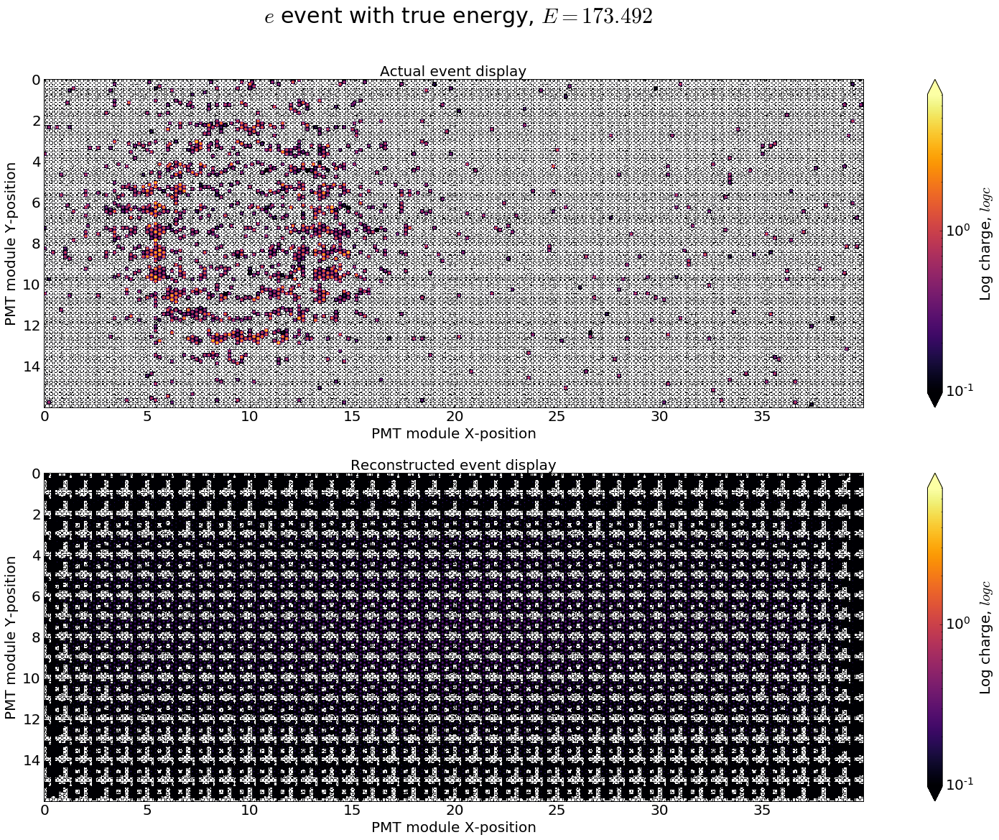

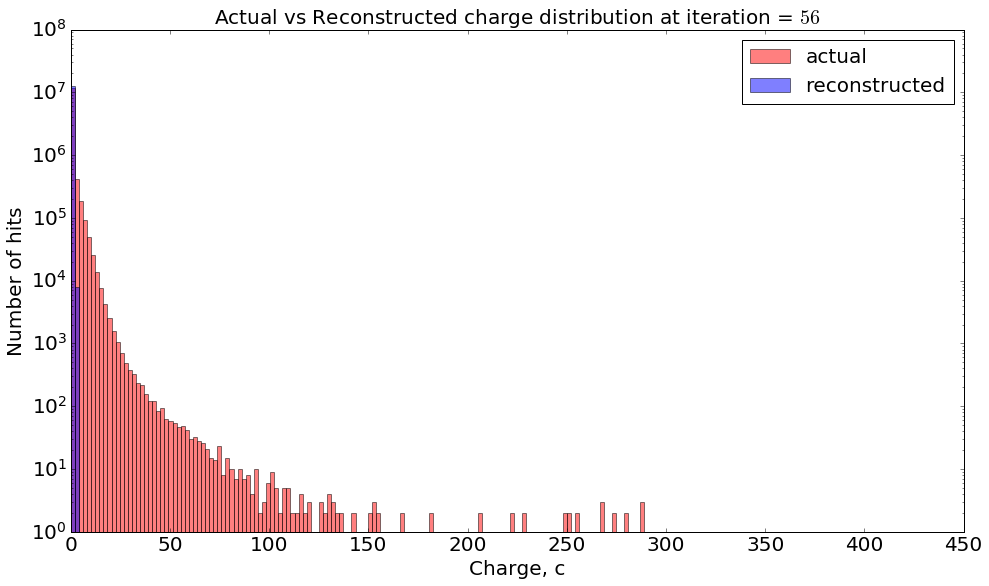

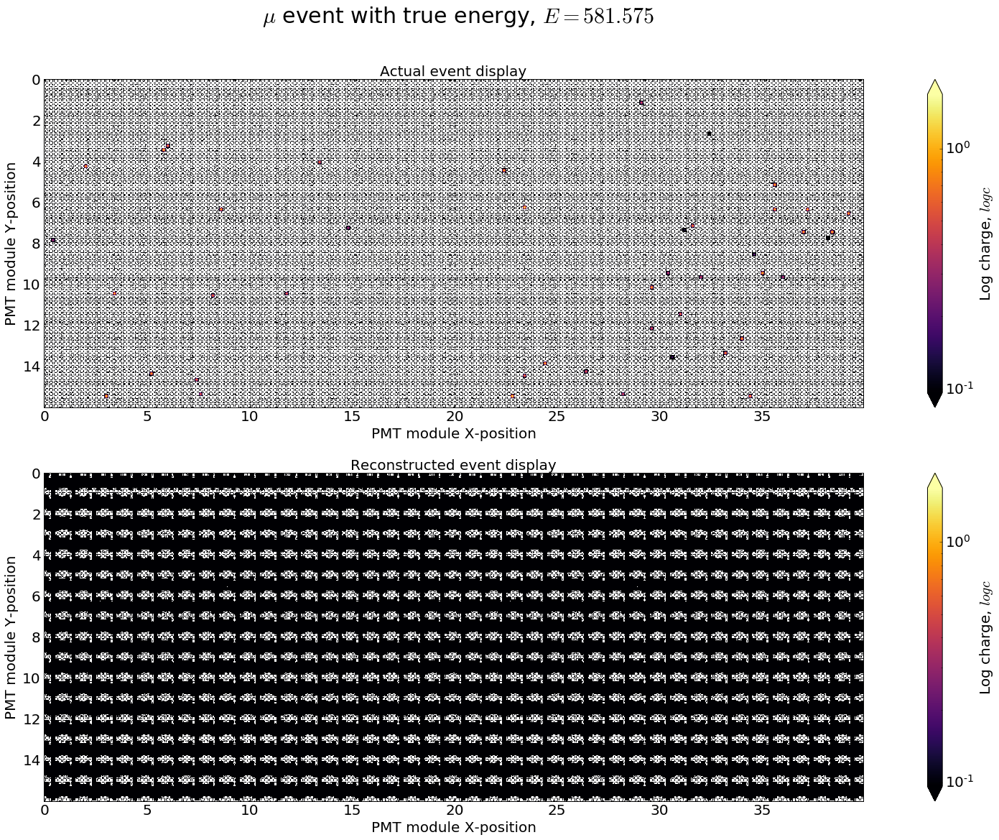

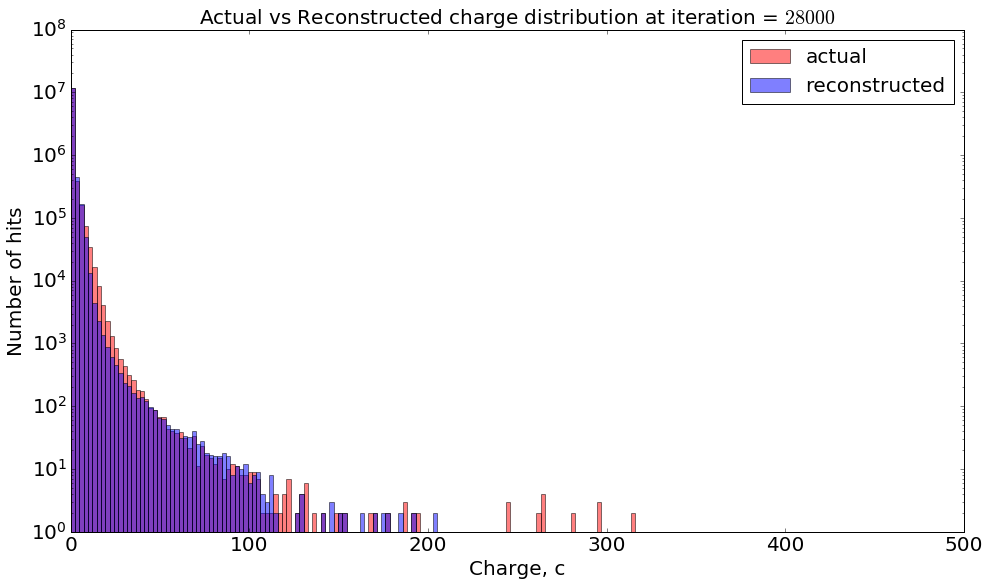

In [10]:
plot_event("20190723_010958", 56, "training")
plot_event("20190723_010958", 28000, "training")

## Latent vector analysis of this model

In [11]:
run_id = "20190723_010958"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Load the numpy array for the various iterations
np_arr_0 = np.load(dump_dir + "iteration_" + str(56) + ".npz")
np_arr_1 = np.load(dump_dir + "iteration_" + str(28000) + ".npz")
np_arr_2 = np.load(dump_dir + "iteration_" + str(28000) + ".npz")

# Extract the latent vector np arrays from the loaded archive
np_arr_0_z, np_arr_1_z, np_arr_2_z = np_arr_0["z"], np_arr_1["z"], np_arr_2["z"]

## Dimension = 0

In [12]:
np_arr_0_z_0 = np_arr_0_z[:,0]
np_arr_1_z_0 = np_arr_1_z[:,0]
np_arr_2_z_0 = np_arr_2_z[:,0]

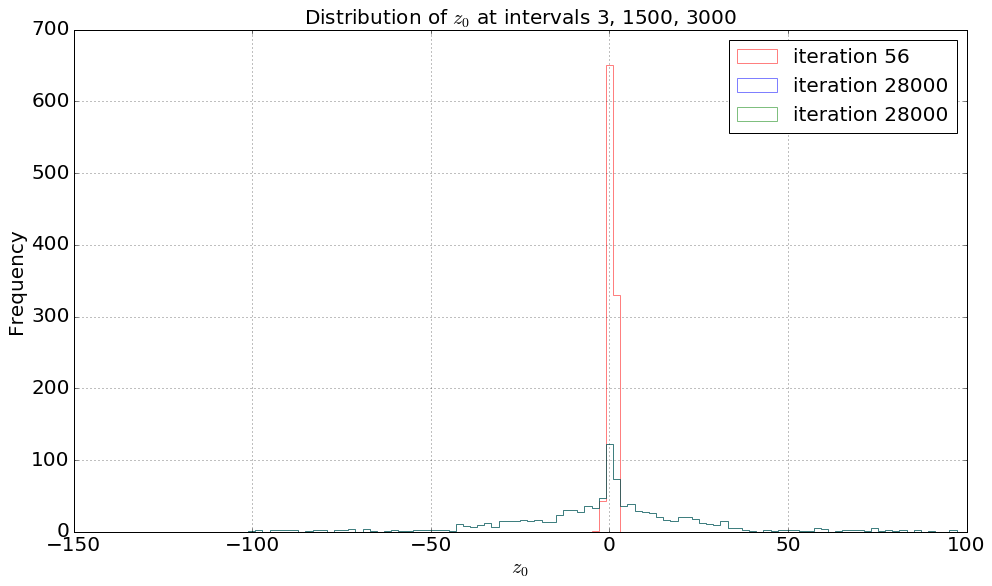

In [13]:
num_bins = 100

# Initialize the plot and corresponding parameters
fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
ax.tick_params(axis="both", labelsize=20)

# Setup the bins beforehand
bins = np.linspace(min(np.amin(np_arr_0_z_0), np.amin(np_arr_1_z_0), np.amin(np_arr_2_z_0)),
                   max(np.amax(np_arr_0_z_0), np.amax(np_arr_1_z_0), np.amax(np_arr_2_z_0)),
                   num_bins)

plt.hist(np_arr_0_z_0, bins, density=False,
         label="iteration 56", color="red",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_1_z_0, bins, density=False,
         label="iteration 28000", color="blue",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_2_z_0, bins, density=False,
         label="iteration 28000", color="green",
         alpha=0.5, stacked=True, histtype="step")

# Setup the axes
ax.set_xlabel(r"$z_0$", fontsize=20)
ax.set_ylabel("Frequency", fontsize=20)

plt.legend(loc="upper right", prop={"size":20})
plt.grid(True)
plt.title(r"Distribution of $z_0$ at intervals 3, 1500, 3000", fontsize=20)

plt.show()

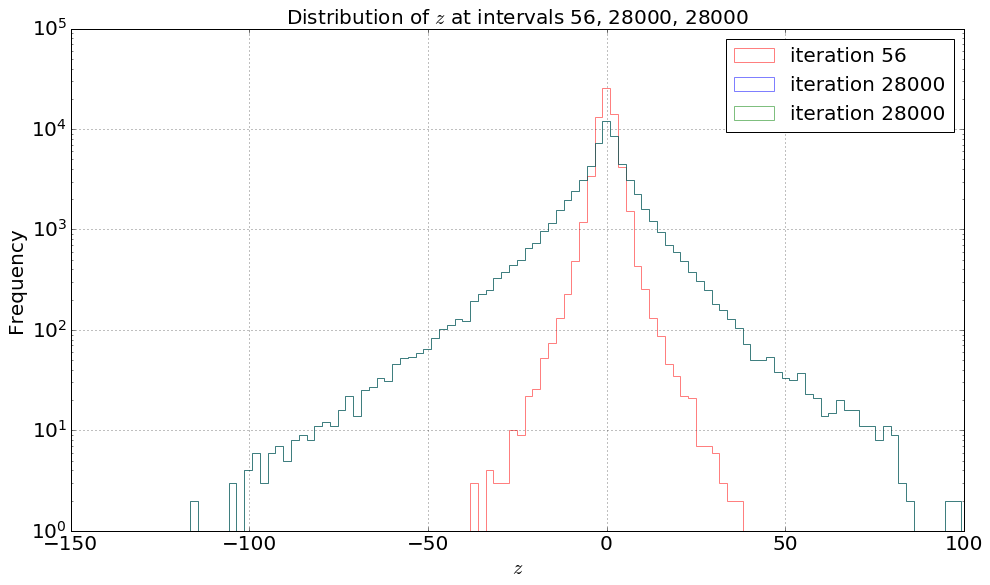

In [14]:
run_id = "20190723_010958"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Load the numpy array for the various iterations
np_arr_0 = np.load(dump_dir + "iteration_" + str(56) + ".npz")
np_arr_1 = np.load(dump_dir + "iteration_" + str(28000) + ".npz")
np_arr_2 = np.load(dump_dir + "iteration_" + str(28000) + ".npz")

# Extract the latent vector np arrays from the loaded archive
np_arr_0_z, np_arr_1_z, np_arr_2_z = np_arr_0["z"], np_arr_1["z"], np_arr_2["z"]

np_arr_0_z_0 = np_arr_0_z.reshape(-1, 1)
np_arr_1_z_0 = np_arr_1_z.reshape(-1, 1)
np_arr_2_z_0 = np_arr_2_z.reshape(-1, 1)

num_bins = 100

# Initialize the plot and corresponding parameters
fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
ax.tick_params(axis="both", labelsize=20)

# Setup the bins beforehand
bins = np.linspace(min(np.amin(np_arr_0_z_0), np.amin(np_arr_1_z_0), np.amin(np_arr_2_z_0)),
                   max(np.amax(np_arr_0_z_0), np.amax(np_arr_1_z_0), np.amax(np_arr_2_z_0)),
                   num_bins)

plt.hist(np_arr_0_z_0, bins, density=False,
         label="iteration 56", color="red",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_1_z_0, bins, density=False,
         label="iteration 28000", color="blue",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_2_z_0, bins, density=False,
         label="iteration 28000", color="green",
         alpha=0.5, stacked=True, histtype="step")

# Setup the axes
ax.set_xlabel(r"$z$", fontsize=20)
ax.set_ylabel("Frequency", fontsize=20)

plt.legend(loc="upper right", prop={"size":20})
plt.yscale("log")
plt.grid(True)
plt.title(r"Distribution of $z$ at intervals 56, 28000, 28000", fontsize=20)

plt.show()

## Train using a smaller dataset : 50000 samples

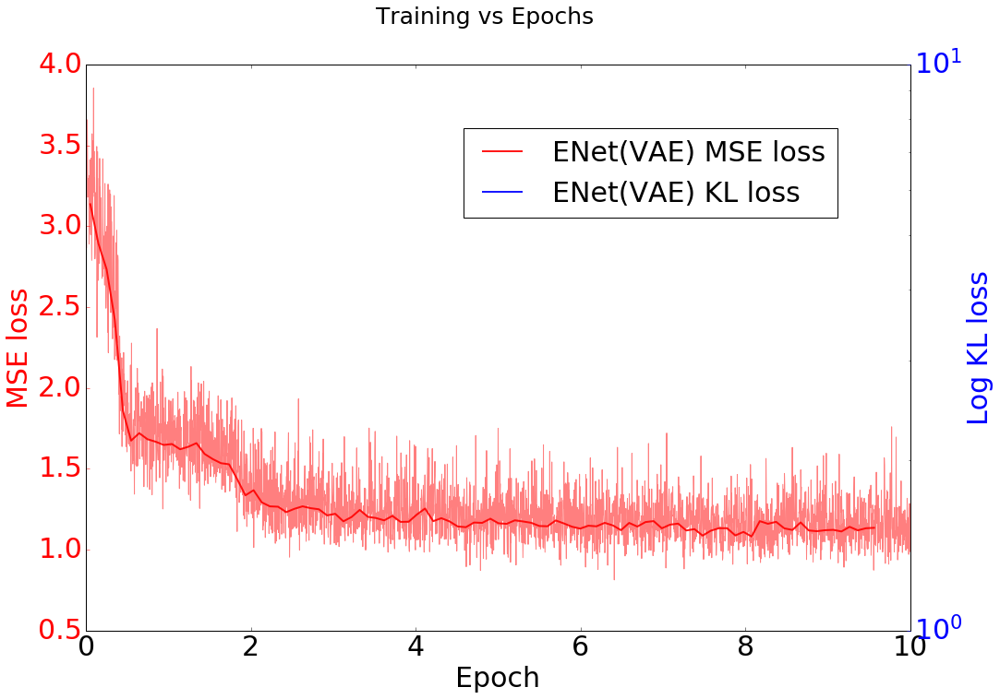

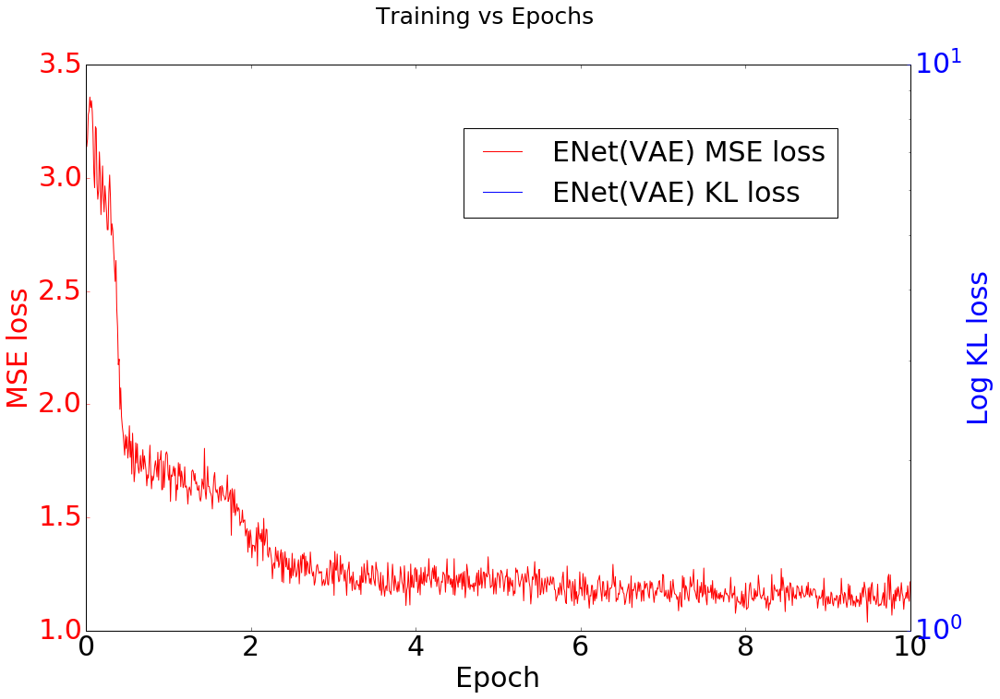

In [15]:
plot_log("20190723_154101", "ENet(VAE)", None, "VAE", "training")
plot_log("20190723_154101", "ENet(VAE)", None, "VAE", "training_validation")

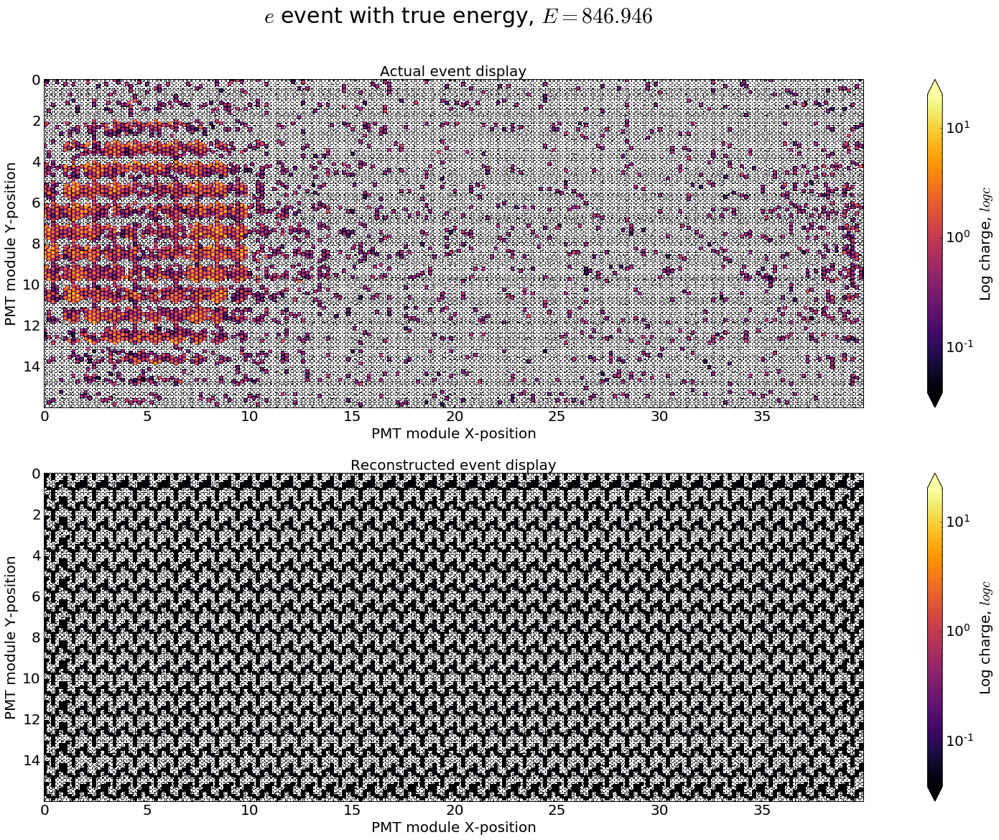

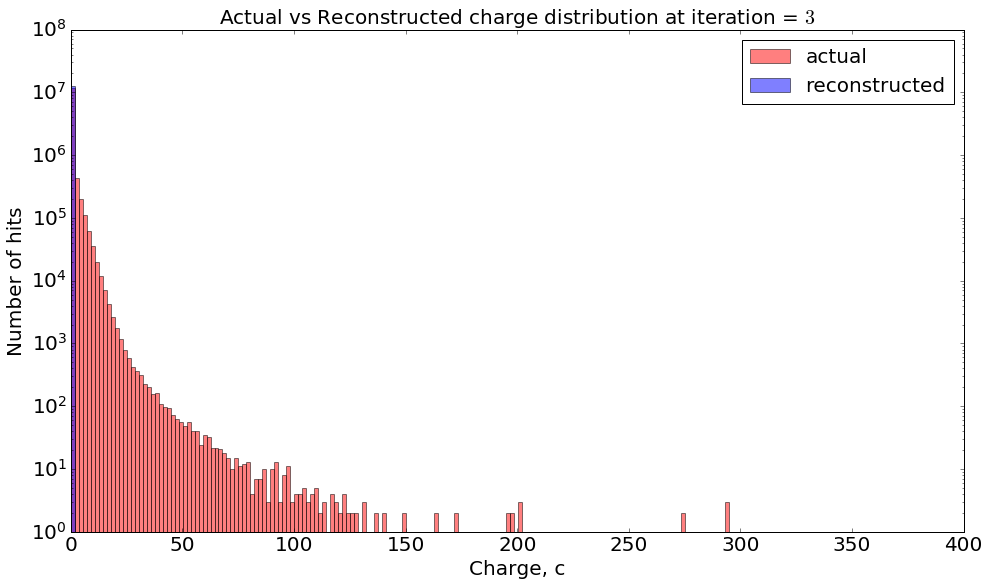

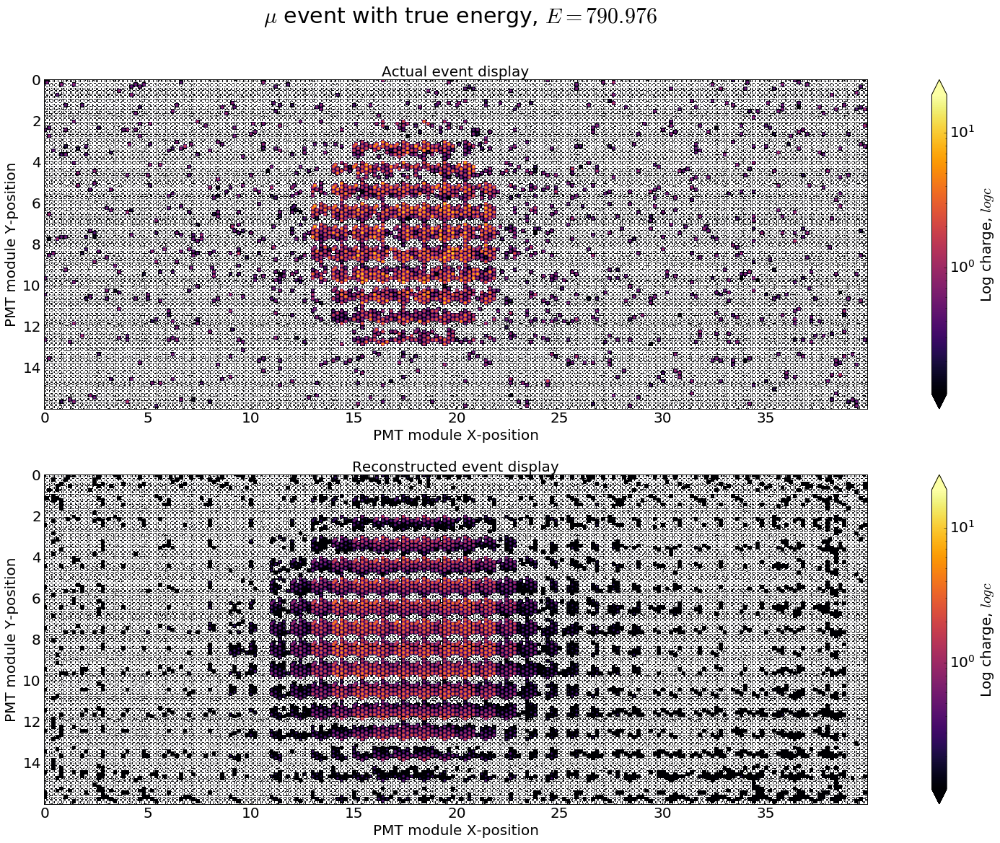

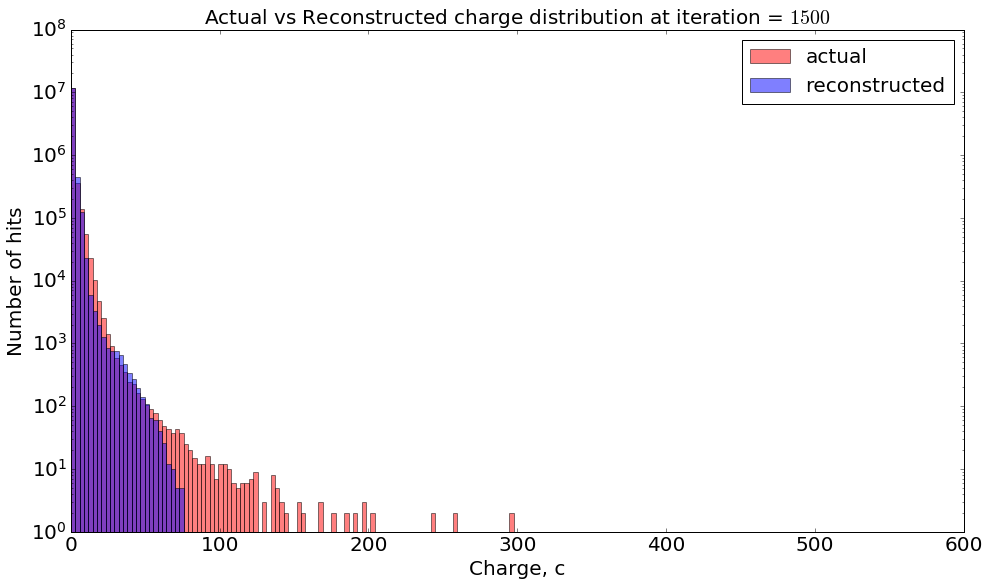

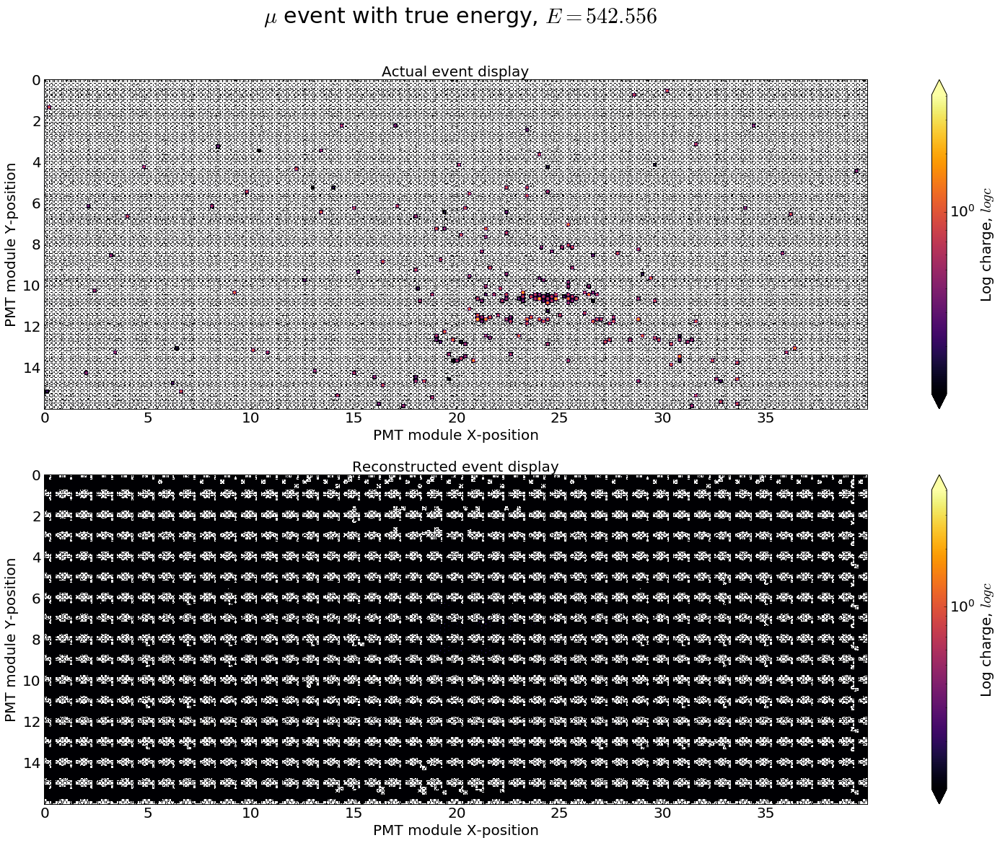

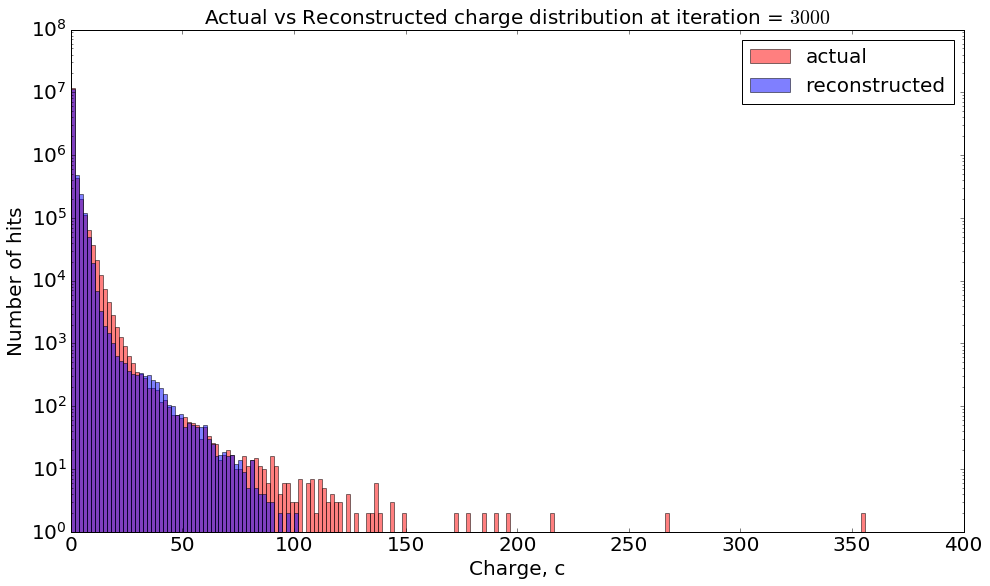

In [16]:
plot_event("20190723_154101", 3, "training")
plot_event("20190723_154101", 1500, "training")
plot_event("20190723_154101", 3000, "training")

## Dimension 0 latent vector analysis

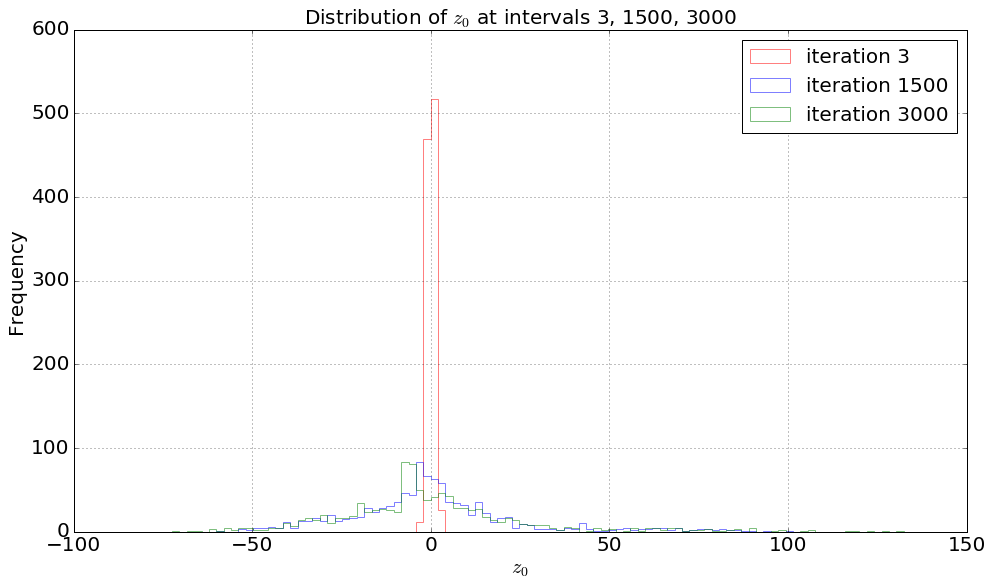

In [17]:
run_id = "20190723_154101"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Load the numpy array for the various iterations
np_arr_0 = np.load(dump_dir + "iteration_" + str(3) + ".npz")
np_arr_1 = np.load(dump_dir + "iteration_" + str(1500) + ".npz")
np_arr_2 = np.load(dump_dir + "iteration_" + str(3000) + ".npz")

# Extract the latent vector np arrays from the loaded archive
np_arr_0_z, np_arr_1_z, np_arr_2_z = np_arr_0["z"], np_arr_1["z"], np_arr_2["z"]

np_arr_0_z_0 = np_arr_0_z[:,0]
np_arr_1_z_0 = np_arr_1_z[:,0]
np_arr_2_z_0 = np_arr_2_z[:,0]

num_bins = 100

# Initialize the plot and corresponding parameters
fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
ax.tick_params(axis="both", labelsize=20)

# Setup the bins beforehand
bins = np.linspace(min(np.amin(np_arr_0_z_0), np.amin(np_arr_1_z_0), np.amin(np_arr_2_z_0)),
                   max(np.amax(np_arr_0_z_0), np.amax(np_arr_1_z_0), np.amax(np_arr_2_z_0)),
                   num_bins)

plt.hist(np_arr_0_z_0, bins, density=False,
         label="iteration 3", color="red",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_1_z_0, bins, density=False,
         label="iteration 1500", color="blue",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_2_z_0, bins, density=False,
         label="iteration 3000", color="green",
         alpha=0.5, stacked=True, histtype="step")

# Setup the axes
ax.set_xlabel(r"$z_0$", fontsize=20)
ax.set_ylabel("Frequency", fontsize=20)

plt.legend(loc="upper right", prop={"size":20})
plt.grid(True)
plt.title(r"Distribution of $z_0$ at intervals 3, 1500, 3000", fontsize=20)

plt.show()

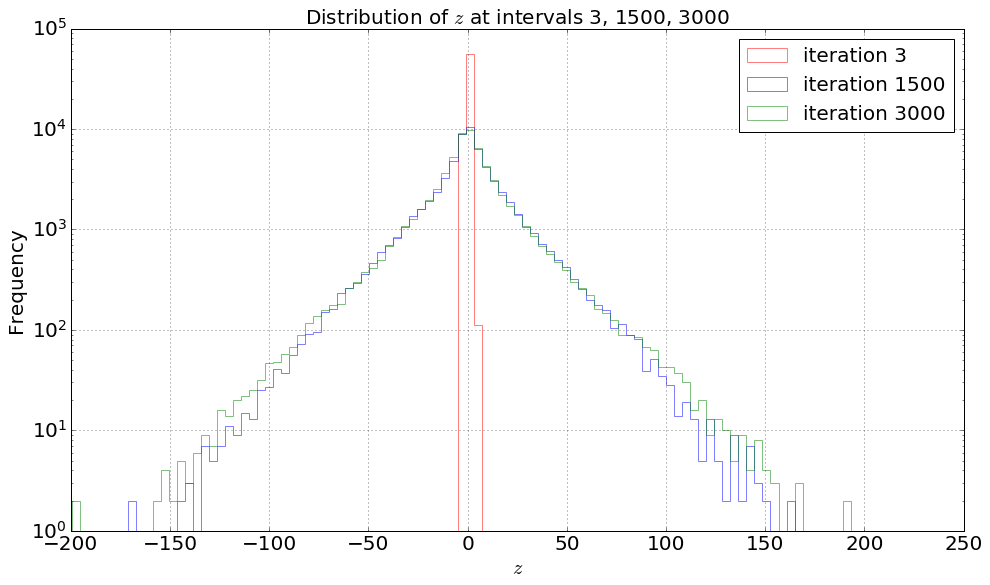

In [18]:
run_id = "20190723_154101"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

# Load the numpy array for the various iterations
np_arr_0 = np.load(dump_dir + "iteration_" + str(3) + ".npz")
np_arr_1 = np.load(dump_dir + "iteration_" + str(1500) + ".npz")
np_arr_2 = np.load(dump_dir + "iteration_" + str(3000) + ".npz")

# Extract the latent vector np arrays from the loaded archive
np_arr_0_z, np_arr_1_z, np_arr_2_z = np_arr_0["z"], np_arr_1["z"], np_arr_2["z"]

np_arr_0_z_0 = np_arr_0_z.reshape(-1, 1)
np_arr_1_z_0 = np_arr_1_z.reshape(-1, 1)
np_arr_2_z_0 = np_arr_2_z.reshape(-1, 1)

num_bins = 100

# Initialize the plot and corresponding parameters
fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
ax.tick_params(axis="both", labelsize=20)

# Setup the bins beforehand
bins = np.linspace(min(np.amin(np_arr_0_z_0), np.amin(np_arr_1_z_0), np.amin(np_arr_2_z_0)),
                   max(np.amax(np_arr_0_z_0), np.amax(np_arr_1_z_0), np.amax(np_arr_2_z_0)),
                   num_bins)

plt.hist(np_arr_0_z_0, bins, density=False,
         label="iteration 3", color="red",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_1_z_0, bins, density=False,
         label="iteration 1500", color="blue",
         alpha=0.5, stacked=True, histtype="step")

plt.hist(np_arr_2_z_0, bins, density=False,
         label="iteration 3000", color="green",
         alpha=0.5, stacked=True, histtype="step")

# Setup the axes
ax.set_xlabel(r"$z$", fontsize=20)
ax.set_ylabel("Frequency", fontsize=20)

plt.legend(loc="upper right", prop={"size":20})
plt.yscale("log")
plt.grid(True)
plt.title(r"Distribution of $z$ at intervals 3, 1500, 3000", fontsize=20)

plt.show()

## Plot the samples drawn randomly from the normal gaussian

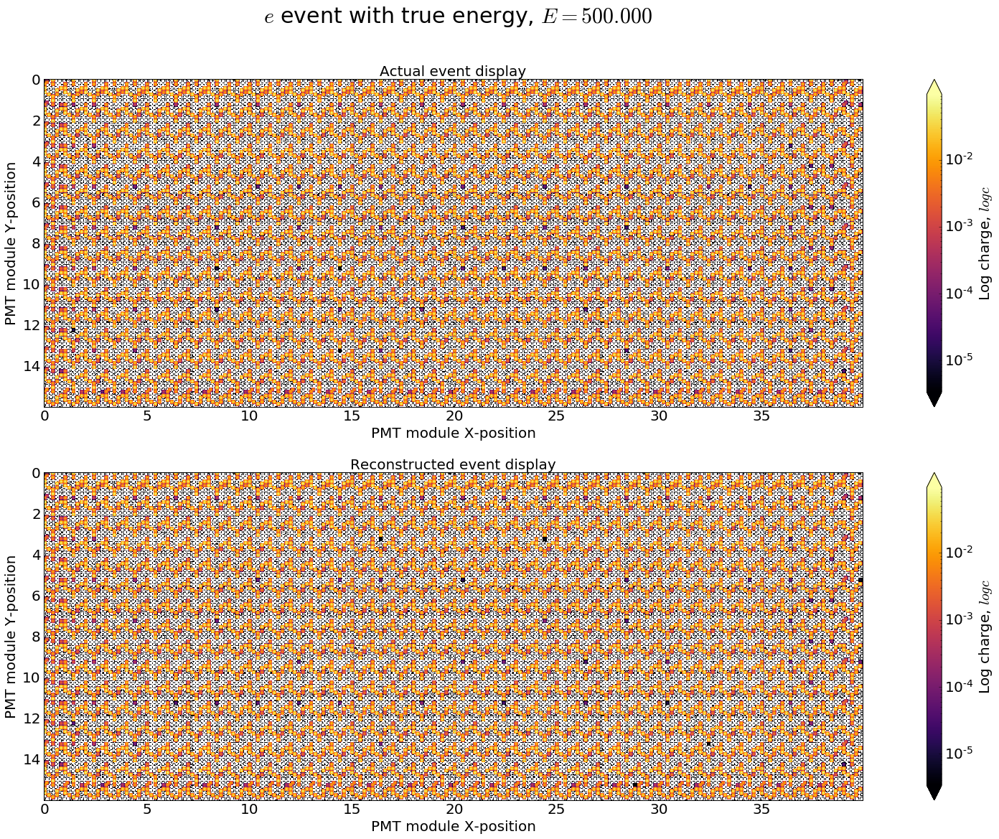

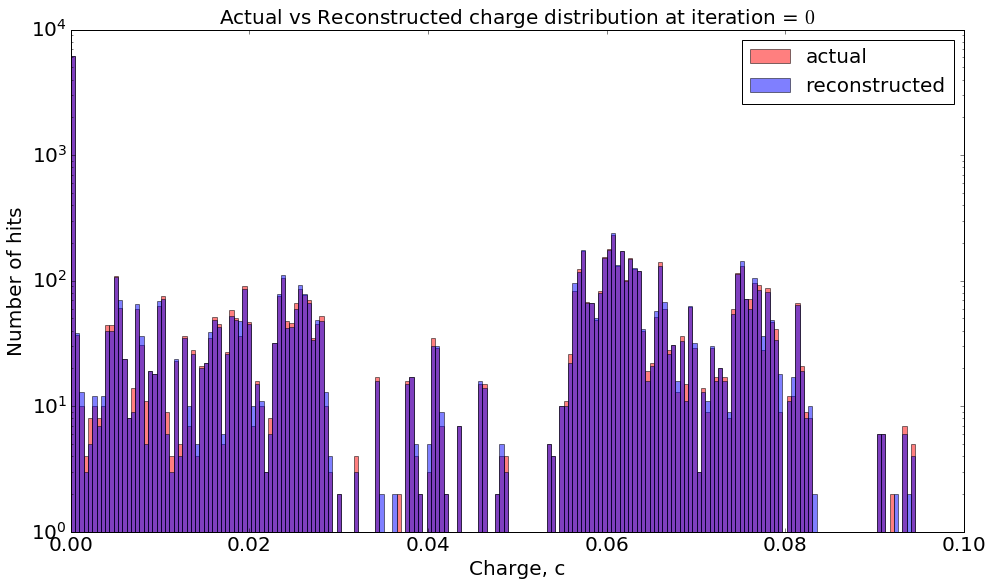

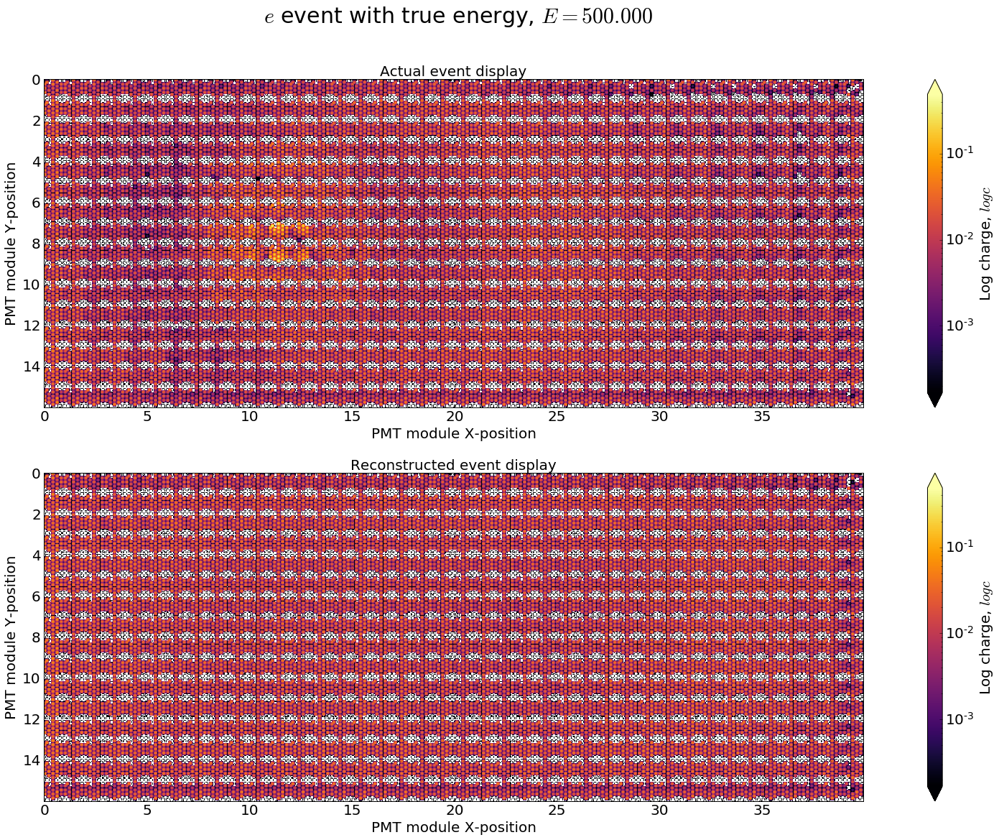

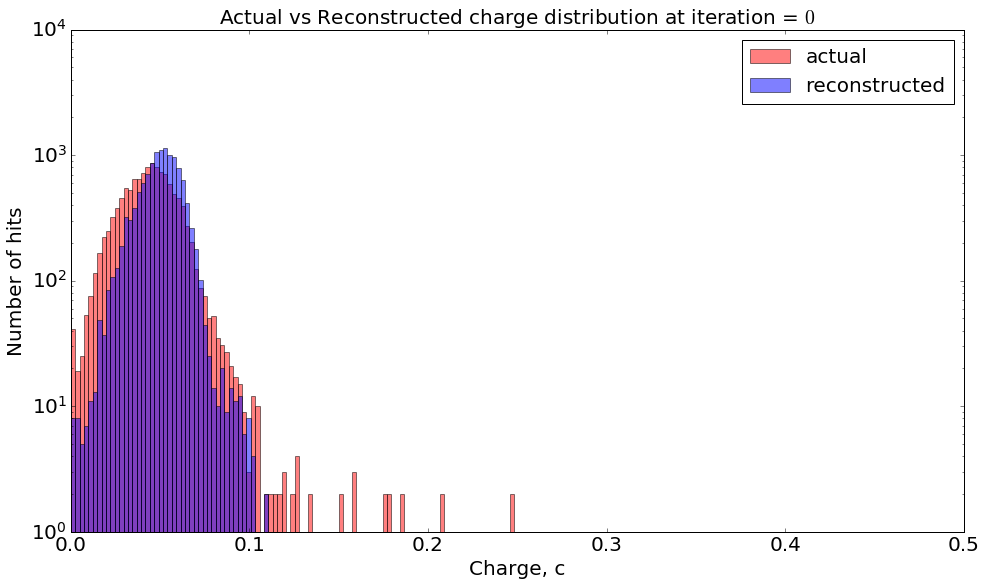

In [19]:
plot_samples("20190723_154101", 32, "ENet_0")
plot_samples("20190723_154101", 64, "ENet_0")

## Multiplying KL loss by 0.1

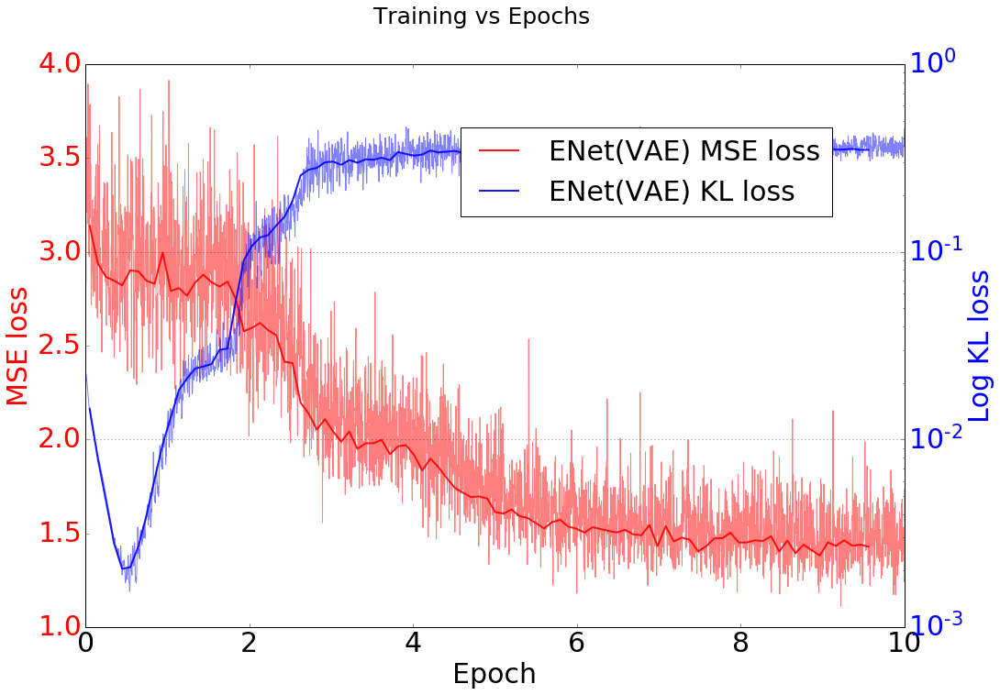

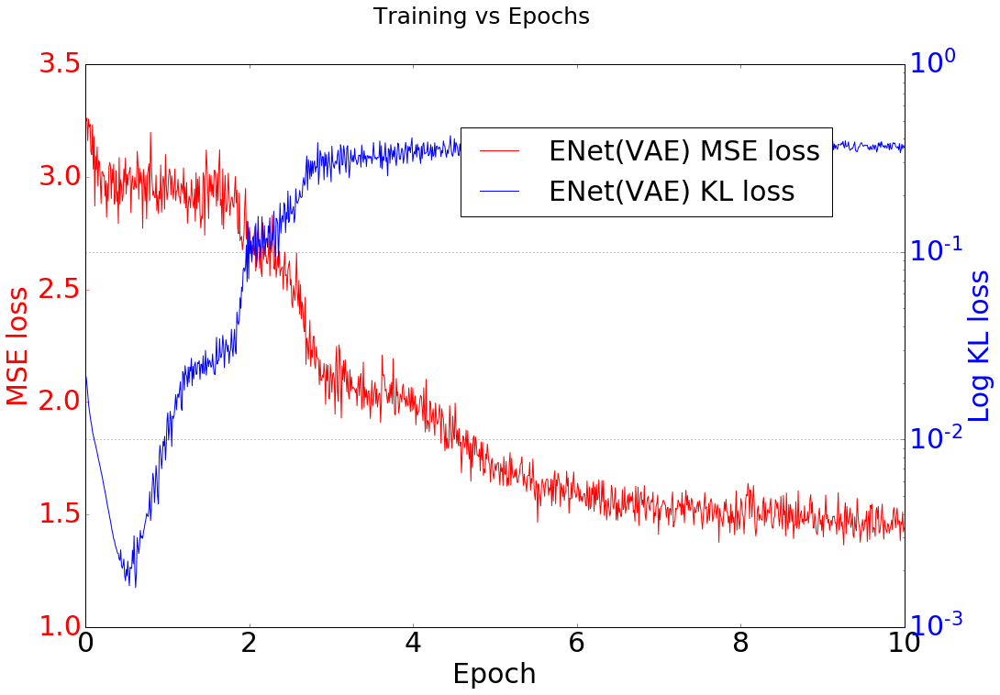

In [20]:
plot_log("20190723_223030", "ENet(VAE)", None, "VAE", "training")
plot_log("20190723_223030", "ENet(VAE)", None, "VAE", "training_validation")

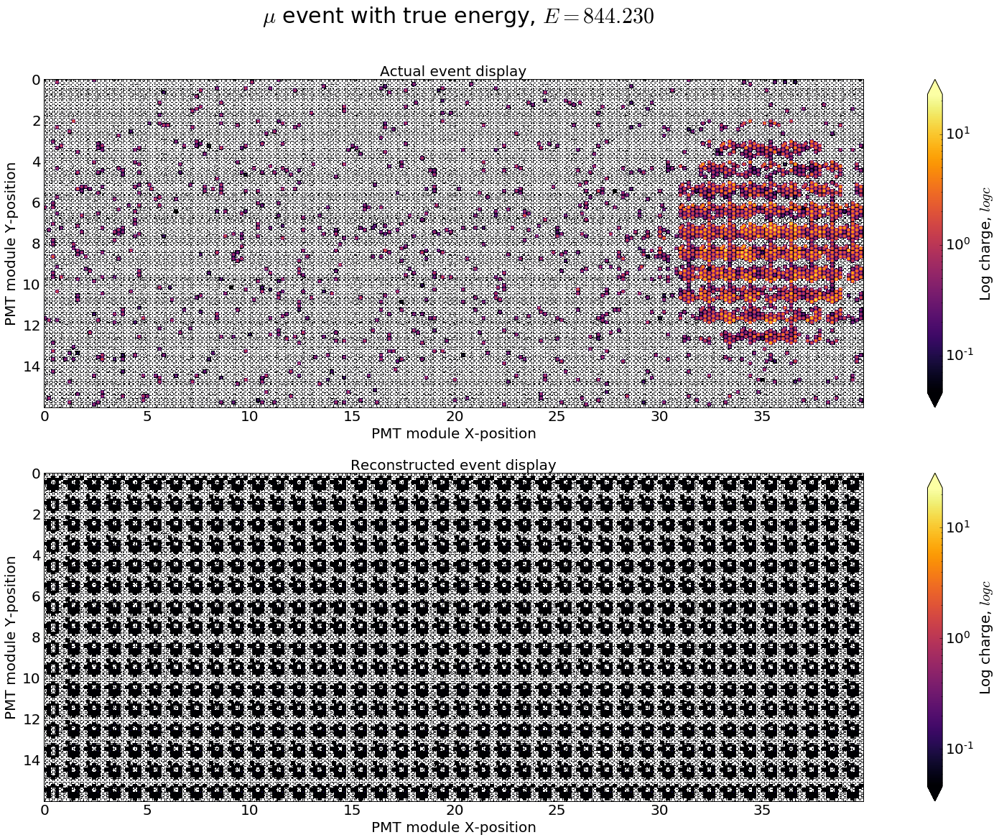

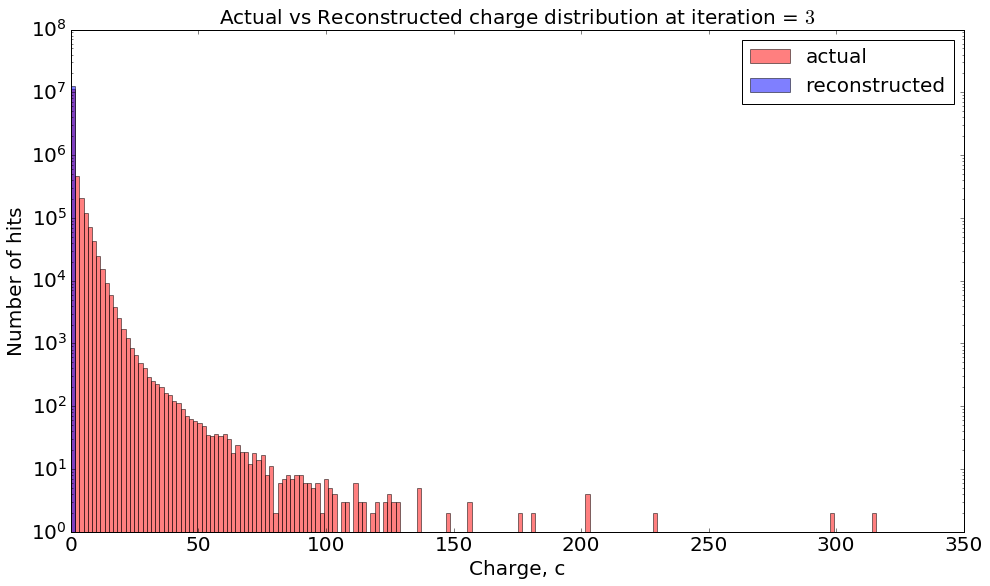

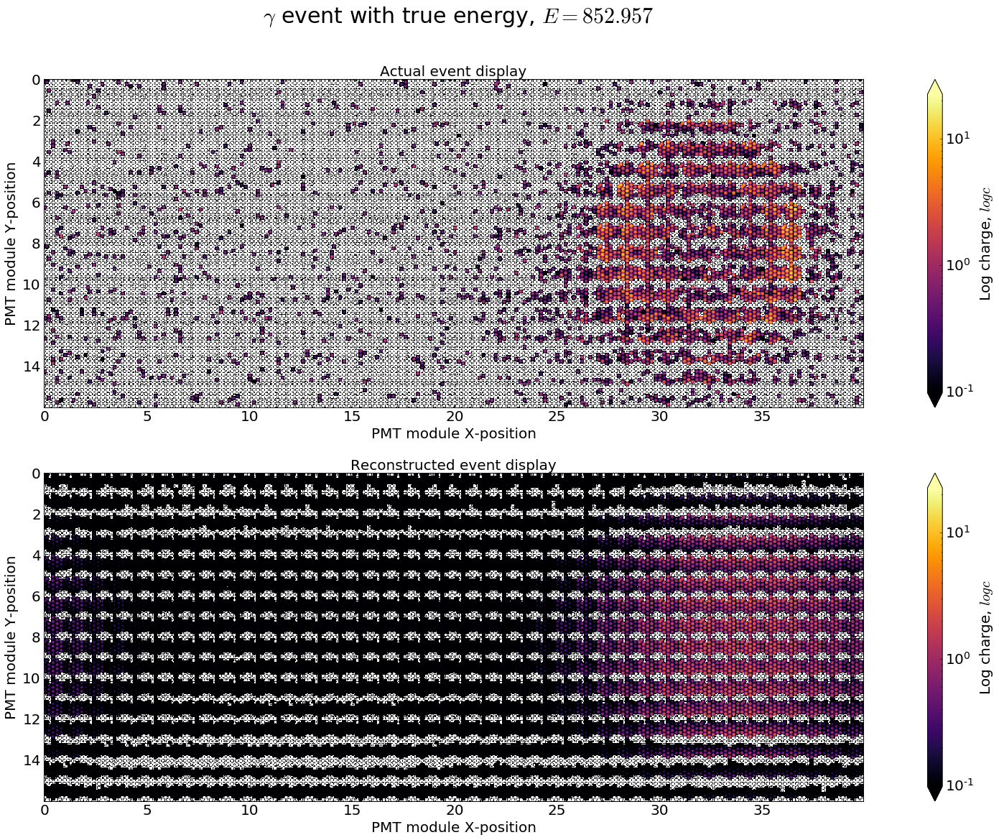

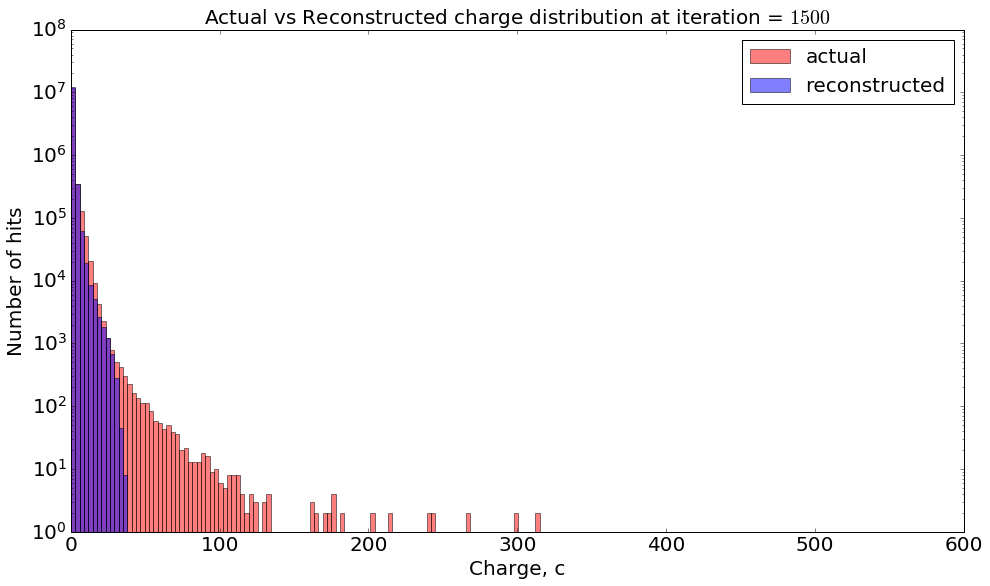

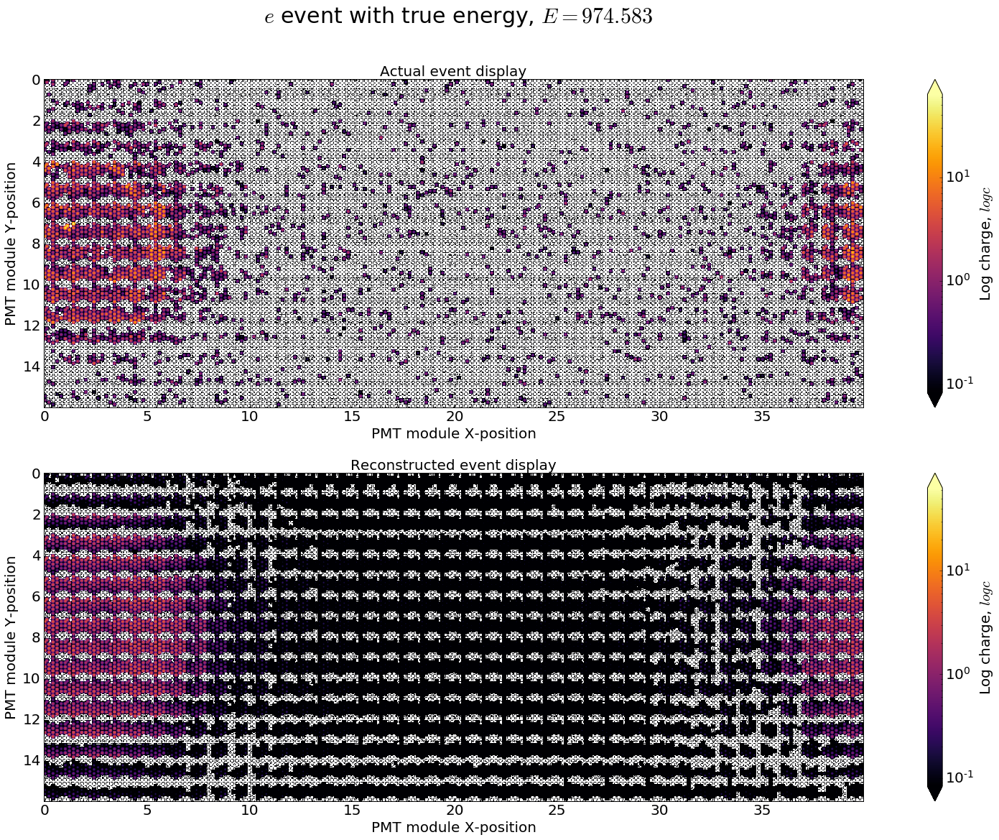

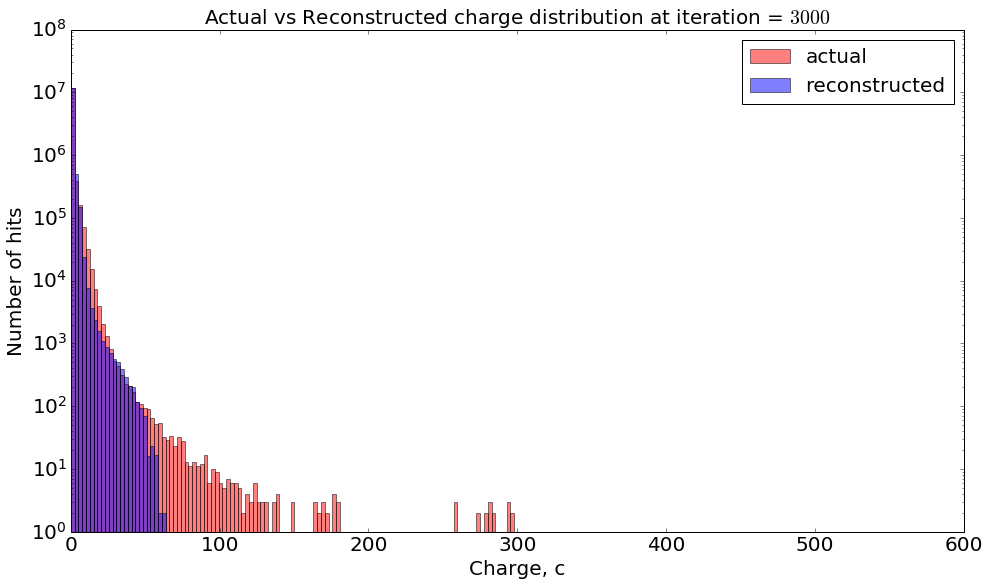

In [21]:
plot_event("20190723_223030", 3, "training")
plot_event("20190723_223030", 1500, "training")
plot_event("20190723_223030", 3000, "training")

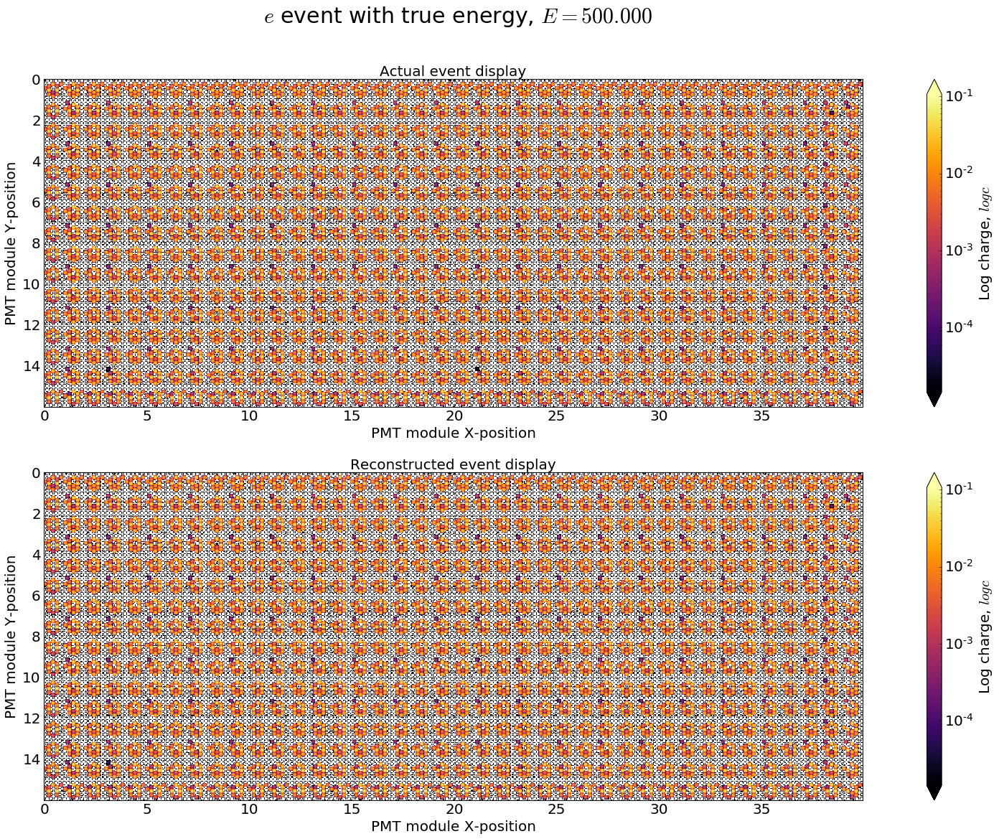

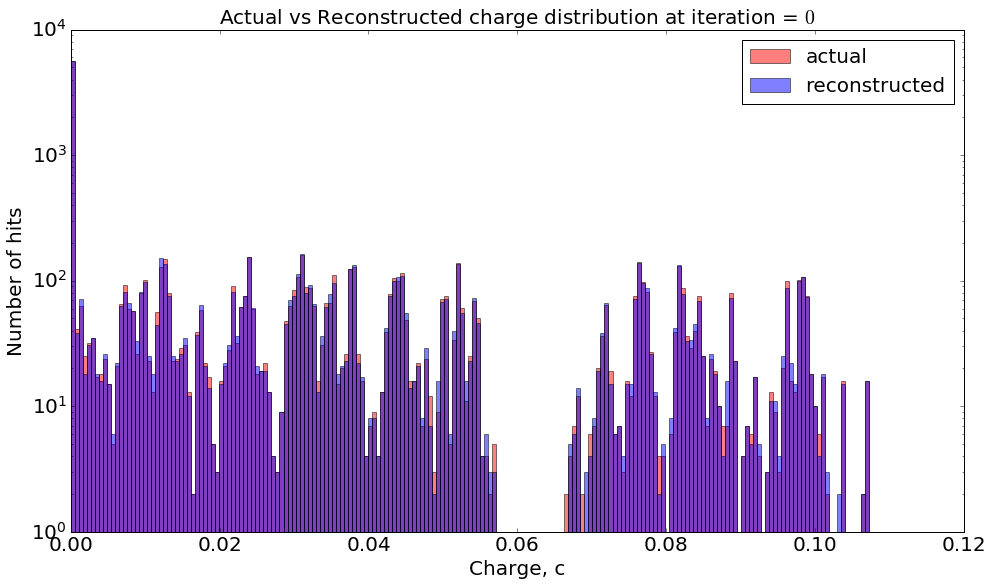

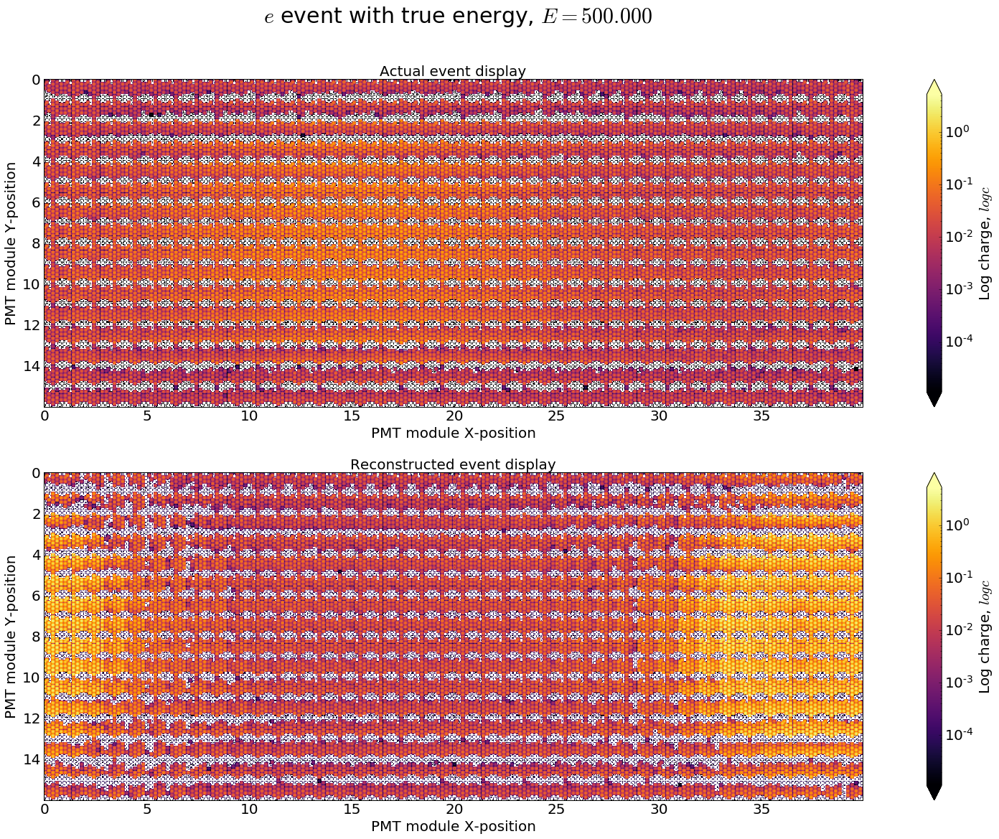

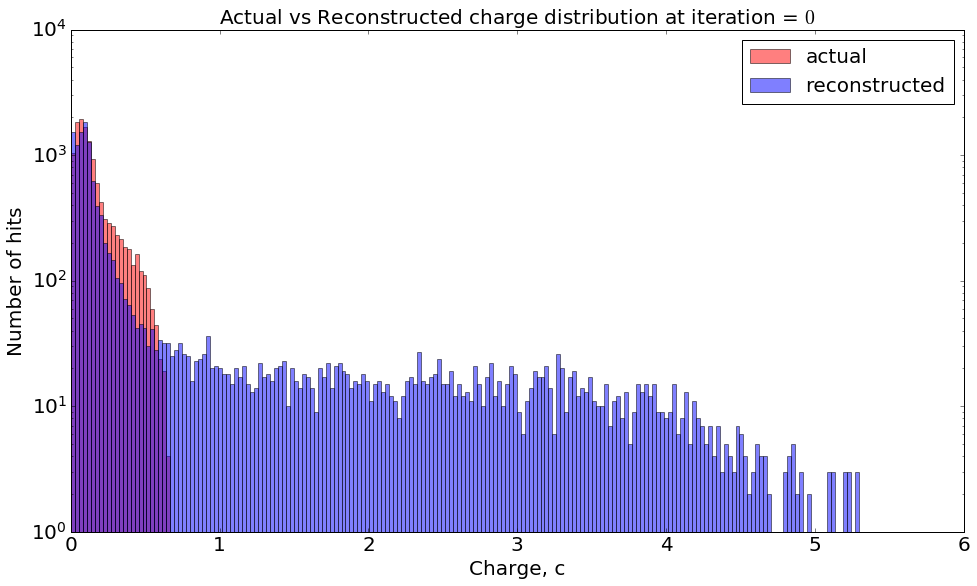

In [6]:
plot_samples("20190723_223030", 32, "ENet_0")
plot_samples("20190723_223030", 64, "ENet_0")